# **YOLOv8n-KITTI-FineTune**

**Cài đặt các thu viện**

In [ ]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 61.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 97.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.1 MB/s eta 0:00:00


**Import thư viện cần thiết**

In [ ]:
from ultralytics import YOLO
import numpy as np
import os, random, shutil
from pathlib import Path
from PIL import Image
from IPython.display import Image as DispImage, display
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


**Các đường dẫn file**

In [ ]:
path_imageRGB='/content/drive/MyDrive/Khóa Luận/Data_Object/training/image_2'
path_label='/content/drive/MyDrive/Khóa Luận/Data_Object/data_object_label_2/training/label_2'
path_testing='/content/drive/MyDrive/Khóa Luận/Data_Object/testing/image_2'

# **Convert từ KITTI label sang YOLO format**

In [ ]:
# lưu nhãn YOLO
output_label_dir = '/content/drive/MyDrive/Khóa Luận/Data_Object/labels_yolo'
os.makedirs(output_label_dir, exist_ok=True)

In [ ]:
def kitti_to_yolo(label_path, img_w, img_h):
    with open(label_path, "r") as f:
        lines = f.readlines()

    yolo_lines = []
    for line in lines:
        cls = line.split()[0]
        if cls not in ["Car", "Pedestrian", "Cyclist"]:
            continue

        x1, y1, x2, y2 = map(float, line.split()[4:8])
        x_center = ((x1 + x2) / 2) / img_w
        y_center = ((y1 + y2) / 2) / img_h
        w = (x2 - x1) / img_w
        h = (y2 - y1) / img_h

        class_id = {"Car": 0, "Pedestrian": 1, "Cyclist": 2}[cls]
        yolo_lines.append(f"{class_id} {x_center} {y_center} {w} {h}")

    return yolo_lines

In [ ]:
# Duyệt qua tất cả file nhãn trong path_label và chuyển
for lbl_fname in os.listdir(path_label):
    if not lbl_fname.endswith('.txt'):
        continue

    lbl_path = os.path.join(path_label, lbl_fname)
    # giả sử tên ảnh giống tên txt, chỉ khác đuôi
    img_name = lbl_fname.replace('.txt', '.png')  # hoặc .jpg tùy dataset
    img_path = os.path.join(path_imageRGB, img_name)

    # bỏ qua nếu ảnh không tồn tại
    if not os.path.isfile(img_path):
        print(f"[WARN] Không tìm thấy ảnh: {img_name}")
        continue

    # lấy kích thước ảnh
    with Image.open(img_path) as img:
        img_w, img_h = img.size

    # chuyển và ghi ra file mới
    yolo_lines = kitti_to_yolo(lbl_path, img_w, img_h)
    out_path = os.path.join(output_label_dir, lbl_fname)
    with open(out_path, 'w') as f:
        f.write('\n'.join(yolo_lines))

print("Chuyển xong tất cả nhãn KITTI → YOLO!")

Chuyển xong tất cả nhãn KITTI → YOLO!


# **Preparing Dataset**

In [ ]:
# Tạo list ảnh & nhãn (đã convert sang YOLO) và zip lại
imgs   = sorted(Path(path_imageRGB).glob('*.*'))
lbls   = sorted(Path(output_label_dir).glob('*.txt'))
pairs  = list(zip(imgs, lbls))
print(f"Tổng số cặp ảnh–nhãn: {len(pairs)}")

Tổng số cặp ảnh–nhãn: 7481


**Chia ra train/validation tỉ lệ: 9:1**

In [ ]:
# Split thành train/val
train_pairs, val_pairs = train_test_split(
    pairs, test_size=0.1, shuffle=True, random_state=42
)
print(f"Train: {len(train_pairs)}  —  Val: {len(val_pairs)}")

Train: 6732  —  Val: 749


In [ ]:
# tạo folder train/valid để copy
train_dir = Path('/content/train'); train_dir.mkdir(exist_ok=True)
valid_dir = Path('/content/valid'); valid_dir.mkdir(exist_ok=True)

In [ ]:
# Copy file vào train/valid
for src_img, src_lbl in tqdm(train_pairs, desc='Copy train'):
    shutil.copy(src_img, train_dir/src_img.name)
    shutil.copy(src_lbl, train_dir/src_lbl.name)

for src_img, src_lbl in tqdm(val_pairs, desc='Copy valid'):
    shutil.copy(src_img, valid_dir/src_img.name)
    shutil.copy(src_lbl, valid_dir/src_lbl.name)

Copy train:   0%|          | 0/6732 [00:00<?, ?it/s]

Copy valid:   0%|          | 0/749 [00:00<?, ?it/s]

**zip**

In [ ]:
TRAIN_DIR = Path('/content/train')
VALID_DIR = Path('/content/valid')

OUTPUT_ZIP = Path('/content/drive/MyDrive/Khóa Luận/Data_Object/Code/Early_Fusion_RGBD_Yolov8/data_rgb_ft/train_valid.zip')

import zipfile

# Tạo ZIP và thêm 2 folder train & valid
with zipfile.ZipFile(OUTPUT_ZIP, 'w', zipfile.ZIP_DEFLATED) as zf:
    # thêm train/*
    for file_path in TRAIN_DIR.rglob('*'):
        zf.write(file_path, file_path.relative_to('/content'))
    # thêm valid/*
    for file_path in VALID_DIR.rglob('*'):
        zf.write(file_path, file_path.relative_to('/content'))

print(f"[✓] Đã tạo file ZIP: {OUTPUT_ZIP}")

[✓] Đã tạo file ZIP: /content/drive/MyDrive/Khóa Luận/Data_Object/Code/Early_Fusion_RGBD_Yolov8/data_rgb_ft/train_valid.zip


# **un_zip**

In [ ]:
import zipfile

ZIP_PATH = Path('/content/drive/MyDrive/Khóa Luận/Data_Object/Code/Early_Fusion_RGBD_Yolov8/data_rgb_ft/train_valid.zip')

# Thư mục giải nén
EXTRACT_DIR = Path('/content')

# Giải nén
with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
    zf.extractall(EXTRACT_DIR)

print(f"[✓] Đã giải nén {ZIP_PATH.name} vào {EXTRACT_DIR}")

[✓] Đã giải nén train_valid.zip vào /content


# **Tạo file cấu hình kitti.yaml**

In [ ]:
classes = ["Car","Pedestrian","Cyclist"]
yaml_content  = "names:\n" + "\n".join(f"- {c}" for c in classes)
yaml_content += f"\nnc: {len(classes)}"
yaml_content += f"\ntrain: {train_dir}"
yaml_content += f"\nval:   {valid_dir}"

In [ ]:
with open('kitti.yaml','w') as f:
    f.write(yaml_content)

print("Đã tạo kitti.yaml:")
print(open('kitti.yaml').read())


Đã tạo kitti.yaml:
names:
- Car
- Pedestrian
- Cyclist
nc: 3
train: /content/train
val:   /content/valid


# **Load mô hình**

In [ ]:
# fine-tuning từ pretrained COCO
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 137MB/s]


# **Train mô hình**

## **Thực nghiệm 1**

In [ ]:
# Huấn luyện
train_results = model.train(
    data='kitti.yaml',
    epochs=10,
    patience=3,
    mixup=0.1,
    project='yolov8n-kitti',
    device=0
)

Ultralytics 8.3.157 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kitti.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=3, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, p

100%|██████████| 755k/755k [00:00<00:00, 24.5MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,433 parameters, 3,011,417 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 108MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 534.7±935.4 MB/s, size: 789.1 KB)


train: Scanning /content/train... 6732 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6732/6732 [00:37<00:00, 181.34it/s]


train: New cache created: /content/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 112.2±16.8 MB/s, size: 855.6 KB)


val: Scanning /content/valid... 749 images, 0 backgrounds, 0 corrupt: 100%|██████████| 749/749 [00:04<00:00, 160.54it/s]

val: New cache created: /content/valid.cache


Plotting labels to yolov8n-kitti/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov8n-kitti/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10       2.1G      1.398      1.636      1.108         74        640: 100%|██████████| 421/421 [03:01<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]


                   all        749       3655      0.543      0.484      0.518      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.12G      1.294      1.045      1.086         37        640: 100%|██████████| 421/421 [02:51<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.15it/s]


                   all        749       3655      0.637      0.512      0.554      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.14G      1.252     0.9091       1.07         37        640: 100%|██████████| 421/421 [02:51<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]


                   all        749       3655       0.58      0.542      0.583      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.15G      1.196     0.8371      1.048         74        640: 100%|██████████| 421/421 [02:47<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

                   all        749       3655      0.665      0.537      0.604      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.17G      1.142     0.7799      1.026         44        640: 100%|██████████| 421/421 [02:49<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.38it/s]

                   all        749       3655      0.777      0.526      0.634      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.19G      1.102     0.7359      1.009         73        640: 100%|██████████| 421/421 [02:54<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all        749       3655      0.741      0.582      0.667      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.21G      1.067     0.6994     0.9943         55        640: 100%|██████████| 421/421 [02:52<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.18it/s]

                   all        749       3655      0.722      0.612      0.671      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.22G      1.031      0.663     0.9803         62        640: 100%|██████████| 421/421 [02:46<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]

                   all        749       3655      0.811      0.589      0.705      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.24G     0.9955     0.6351     0.9674         46        640: 100%|██████████| 421/421 [02:46<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]

                   all        749       3655      0.756      0.648      0.723      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.26G     0.9639     0.6101      0.954         42        640: 100%|██████████| 421/421 [02:52<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all        749       3655      0.818      0.627      0.729       0.46



10 epochs completed in 0.511 hours.
Optimizer stripped from yolov8n-kitti/train/weights/last.pt, 6.2MB
Optimizer stripped from yolov8n-kitti/train/weights/best.pt, 6.2MB

Validating yolov8n-kitti/train/weights/best.pt...
Ultralytics 8.3.157 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.41it/s]


                   all        749       3655      0.812      0.637      0.728       0.46
                   Car        678       3040      0.888      0.802      0.902      0.667
            Pedestrian        179        441      0.783      0.501      0.625      0.344
               Cyclist        124        174      0.766      0.609      0.659      0.369
Speed: 0.2ms preprocess, 1.3ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to yolov8n-kitti/train


### **Đánh giá mô hình**

In [ ]:
# Đánh giá trên tập validation
val_results = model.val()

Ultralytics 8.3.157 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2187.7±1304.3 MB/s, size: 828.3 KB)


val: Scanning /content/valid.cache... 749 images, 0 backgrounds, 0 corrupt: 100%|██████████| 749/749 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:12<00:00,  3.79it/s]


                   all        749       3655      0.814      0.638      0.729      0.461
                   Car        678       3040      0.889      0.801      0.902      0.667
            Pedestrian        179        441      0.776      0.502      0.625      0.345
               Cyclist        124        174      0.777      0.609       0.66      0.371
Speed: 0.4ms preprocess, 2.3ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to yolov8n-kitti/train2


### **Eval**

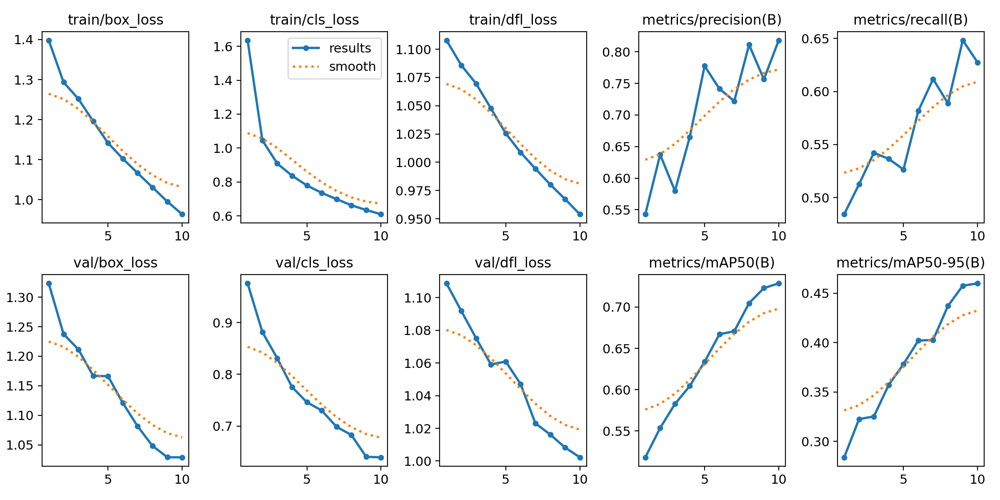

In [ ]:
# Hiển thị kết quả train/val
display(DispImage('/content/yolov8n-kitti/train/results.png', width=600))

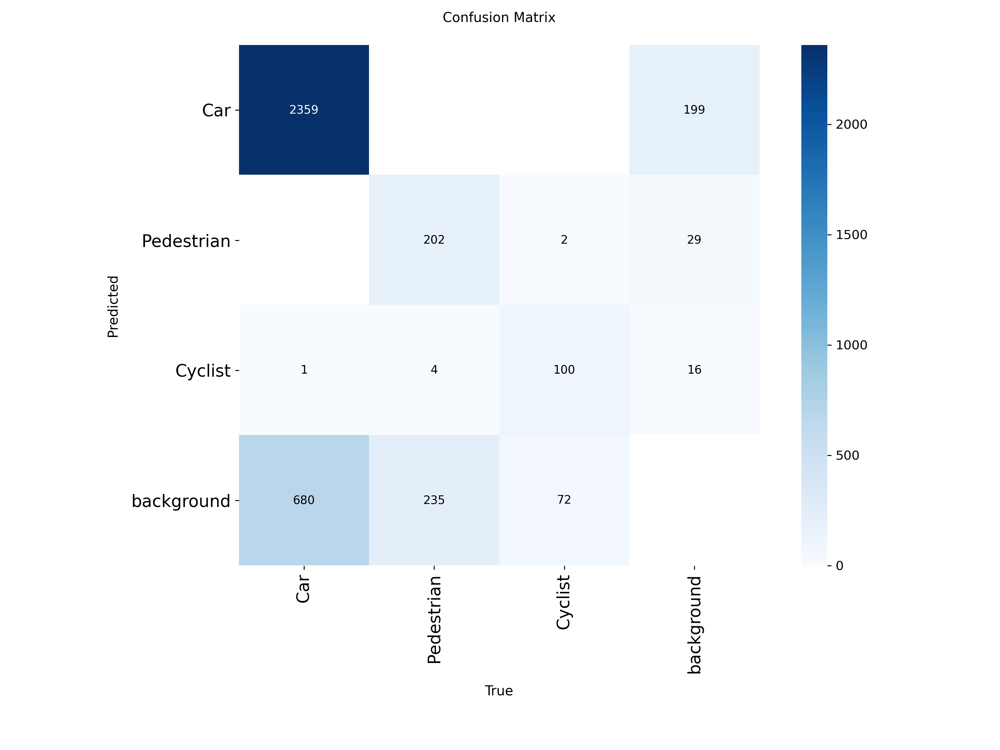

In [ ]:
display(DispImage('/content/yolov8n-kitti/train/confusion_matrix.png', width=600))

### **Dự đoán ngẫu nhiên trên tập test**

In [ ]:
# Lấy list tất cả ảnh và chọn ngẫu nhiên 10 ảnh
test_dir    = Path(path_testing)
all_images = list(test_dir.glob('*.*'))
random_images = random.sample(all_images, min(10, len(all_images)))


In [ ]:
# Predict trên 10 ảnh và lưu kết quả vào runs/predict/predict
results = model.predict(
    source=[str(p) for p in random_images],
    save=True,
    project='yolov8n-kitti',
    name='predict',
    exist_ok=True
)


0: 640x640 1 Car, 5.2ms
1: 640x640 15 Cars, 5.2ms
2: 640x640 2 Cars, 5.2ms
3: 640x640 1 Pedestrian, 5.2ms
4: 640x640 9 Cars, 5.2ms
5: 640x640 9 Cars, 5.2ms
6: 640x640 8 Cars, 5.2ms
7: 640x640 3 Cars, 5.2ms
8: 640x640 6 Cars, 1 Cyclist, 5.2ms
9: 640x640 7 Cars, 9 Pedestrians, 5.2ms
Speed: 4.6ms preprocess, 5.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to yolov8n-kitti/predict


In [ ]:
# Thu lại danh sách các file đã được lưu (có bbox)
pred_dir = Path('/content/yolov8n-kitti/predict')
pred_images = sorted(pred_dir.glob('*.*'))

In [ ]:
# 5. Hàm vẽ kết quả
def plot_images(images):
    num_images = len(images)
    fig, axes = plt.subplots(num_images, 1, figsize=(15, 5 * num_images))
    for ax in axes.flat:
        ax.axis('off')
    for i, img_path in enumerate(images):
        img = Image.open(img_path)
        axes[i].imshow(img)
    plt.tight_layout()
    plt.show()

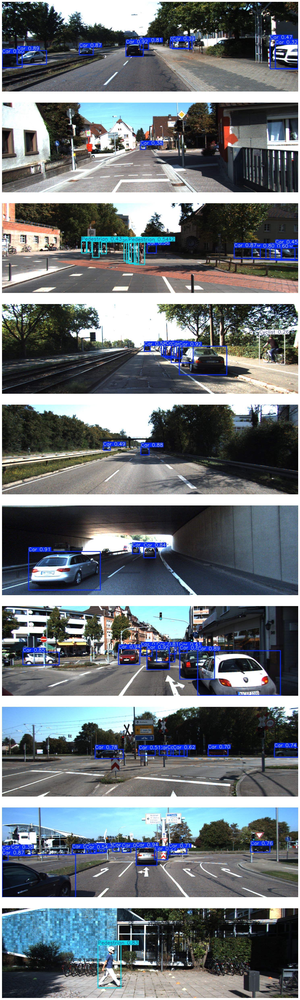

In [ ]:
plot_images(pred_images)

In [ ]:
# Copy cả thư mục sang Drive
!cp -r "yolov8n-kitti" "/content/drive/MyDrive/Khóa Luận/Data_Object/Code/output_yolov8_fine_tuning_on_kitti"


### **đánh giá trên toàn bộ tập test**

In [ ]:
# Đường dẫn tới model và thư mục test
model_path = '/content/drive/MyDrive/Khóa Luận/Data_Object/Code/output_yolov8_fine_tuning_on_kitti/yolov8n-kitti/train/weights/best.pt'
test_dir   = Path('/content/drive/MyDrive/Khóa Luận/Data_Object/testing/image_2')
out_dir    = Path('/content/drive/MyDrive/Khóa Luận/kitti_submit_yolov8_ft')
out_dir.mkdir(exist_ok=True)

In [ ]:
# Load model
model = YOLO(model_path)

In [ ]:
# Chạy predict từng ảnh, ghi ra KITTI-format .txt
cls_map = {0:'Car', 1:'Pedestrian', 2:'Cyclist'}

In [ ]:
for img_path in sorted(test_dir.glob('*.*')):
    # predict 1 ảnh
    res = model.predict(source=str(img_path), save=False, verbose=False)[0]
    boxes  = res.boxes.xyxy.cpu().numpy()   # shape (N,4)
    classes= res.boxes.cls.cpu().numpy().astype(int)  # shape (N,)
    confs  = res.boxes.conf.cpu().numpy()  # shape (N,)

    # mở file output
    out_txt = out_dir / f"{img_path.stem}.txt"
    with open(out_txt, 'w') as f:
        for (x1,y1,x2,y2), c, p in zip(boxes, classes, confs):
            # KITTI 2D detection format:
            # <class> <trunc> <occl> <alpha> <x1> <y1> <x2> <y2>
            # <dim_x> <dim_y> <dim_z> <loc_x> <loc_y> <loc_z> <rot_y> <score>
            line = (
                f"{cls_map[c]} 0 0 0 "
                f"{x1:.2f} {y1:.2f} {x2:.2f} {y2:.2f} "
                "0 0 0 0 0 0 0 "
                f"{p:.4f}"
            )
            f.write(line + "\n")

print(f"Đã ghi xong {len(list(out_dir.glob('*.txt')))} files vào {out_dir}")

Đã ghi xong 7518 files vào /content/drive/MyDrive/Khóa Luận/kitti_submit


In [ ]:
# Nén cả thư mục dạng zip
shutil.make_archive('kitti_predictions_yolov8_ft', 'zip', root_dir=str(out_dir))
print("Tạo file kitti_predictions_yolov8_ft.zip thành công!")

Tạo file kitti_predictions_yolov8_ft.zip thành công!


## **Thực nghiệm 2 - fine tuning với 50 epoch**

In [ ]:
# Huấn luyện
train_results = model.train(
    data='kitti.yaml',
    epochs=50,
    patience=3,
    mixup=0.1,
    project='yolov8n-kitti-v2',
    device=0
)

Ultralytics 8.3.161 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kitti.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=3, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, p

100%|██████████| 755k/755k [00:00<00:00, 23.8MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,433 parameters, 3,011,417 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 99.5MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 111.8±17.4 MB/s, size: 789.1 KB)


train: Scanning /content/train... 6732 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6732/6732 [00:36<00:00, 182.67it/s]


train: New cache created: /content/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 116.2±30.6 MB/s, size: 855.6 KB)


val: Scanning /content/valid... 749 images, 0 backgrounds, 0 corrupt: 100%|██████████| 749/749 [00:04<00:00, 166.92it/s]

val: New cache created: /content/valid.cache


Plotting labels to yolov8n-kitti-v2/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov8n-kitti-v2/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.18G      1.393      1.452      1.095         75        640: 100%|██████████| 421/421 [03:25<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]


                   all        749       3655      0.649      0.479      0.522      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.3G      1.303      1.026      1.082        144        640: 100%|██████████| 421/421 [03:15<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]


                   all        749       3655       0.72      0.524      0.595      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.32G      1.263     0.9316      1.067        123        640: 100%|██████████| 421/421 [03:07<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.80it/s]

                   all        749       3655      0.674      0.503       0.58      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.46G      1.241     0.8908      1.059        123        640: 100%|██████████| 421/421 [03:07<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]

                   all        749       3655      0.748      0.516      0.608      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.47G      1.207      0.848      1.046        112        640: 100%|██████████| 421/421 [03:11<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]

                   all        749       3655      0.766      0.541      0.641       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.49G      1.175     0.8203      1.033        127        640: 100%|██████████| 421/421 [03:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]


                   all        749       3655      0.785      0.571      0.668      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.64G      1.157     0.7966      1.029        146        640: 100%|██████████| 421/421 [03:09<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.32it/s]

                   all        749       3655      0.749      0.618      0.685      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.66G      1.144      0.781      1.026         77        640: 100%|██████████| 421/421 [03:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all        749       3655      0.765      0.601      0.687      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.68G      1.116     0.7609      1.016        111        640: 100%|██████████| 421/421 [03:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.81it/s]

                   all        749       3655      0.781      0.602      0.696      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.69G      1.111     0.7522      1.011        143        640: 100%|██████████| 421/421 [03:08<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.10it/s]

                   all        749       3655      0.812      0.618      0.723      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.71G      1.099     0.7385      1.008        154        640: 100%|██████████| 421/421 [03:11<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.56it/s]


                   all        749       3655      0.801      0.631       0.73      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.73G      1.083     0.7219     0.9992        171        640: 100%|██████████| 421/421 [03:10<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]

                   all        749       3655      0.789      0.635      0.726      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.74G      1.073     0.7157      0.998         97        640: 100%|██████████| 421/421 [03:10<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]


                   all        749       3655      0.813      0.648      0.739      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.76G      1.057     0.6999     0.9942        137        640: 100%|██████████| 421/421 [03:06<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]


                   all        749       3655      0.817      0.649      0.743      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.78G      1.048     0.6891     0.9892        115        640: 100%|██████████| 421/421 [03:06<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.24it/s]

                   all        749       3655      0.834       0.66      0.757      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.79G      1.041     0.6813     0.9827         98        640: 100%|██████████| 421/421 [03:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]

                   all        749       3655      0.778      0.689      0.761      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.81G      1.033     0.6745     0.9821        173        640: 100%|██████████| 421/421 [03:07<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.25it/s]


                   all        749       3655      0.817      0.679      0.768      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.83G       1.02     0.6665       0.98         83        640: 100%|██████████| 421/421 [03:04<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]

                   all        749       3655      0.847      0.694      0.783      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.85G      1.023     0.6629     0.9783         96        640: 100%|██████████| 421/421 [03:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.17it/s]


                   all        749       3655      0.865      0.683      0.792      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.86G       1.01     0.6545     0.9765        110        640: 100%|██████████| 421/421 [03:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]


                   all        749       3655      0.842      0.695      0.785      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.88G          1     0.6472     0.9686        157        640: 100%|██████████| 421/421 [03:01<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.12it/s]


                   all        749       3655      0.858      0.713      0.806      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       2.9G     0.9893     0.6383      0.966         86        640: 100%|██████████| 421/421 [03:02<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]


                   all        749       3655      0.816      0.704      0.797      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.91G      0.989     0.6381     0.9667        125        640: 100%|██████████| 421/421 [03:02<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]


                   all        749       3655      0.841      0.716      0.813      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.93G     0.9822      0.633     0.9638         94        640: 100%|██████████| 421/421 [03:01<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]


                   all        749       3655      0.884      0.698      0.813      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.95G     0.9761     0.6294     0.9626        118        640: 100%|██████████| 421/421 [03:02<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.31it/s]

                   all        749       3655      0.825      0.736      0.812      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.97G     0.9718     0.6229     0.9594        143        640: 100%|██████████| 421/421 [03:03<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.46it/s]

                   all        749       3655      0.874      0.726      0.821      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.98G     0.9669     0.6171     0.9572         92        640: 100%|██████████| 421/421 [03:01<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.65it/s]


                   all        749       3655      0.872      0.714      0.816      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         3G     0.9471     0.6027     0.9528        123        640: 100%|██████████| 421/421 [02:59<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]


                   all        749       3655      0.857      0.732       0.82      0.532

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.02G     0.9467     0.6023      0.951        126        640: 100%|██████████| 421/421 [02:58<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.19it/s]


                   all        749       3655       0.88      0.742      0.833      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.04G     0.9406      0.599     0.9513        125        640: 100%|██████████| 421/421 [02:58<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]


                   all        749       3655      0.891      0.721      0.837      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.05G     0.9408     0.5987     0.9499        165        640: 100%|██████████| 421/421 [02:59<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.55it/s]

                   all        749       3655      0.854      0.741      0.833      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.07G     0.9399     0.5955     0.9482         75        640: 100%|██████████| 421/421 [02:59<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.47it/s]


                   all        749       3655      0.864      0.744      0.834      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.22G     0.9299     0.5888     0.9443        162        640: 100%|██████████| 421/421 [03:00<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.22it/s]


                   all        749       3655      0.893      0.732      0.844      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.24G     0.9125     0.5793      0.942         80        640: 100%|██████████| 421/421 [03:00<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.18it/s]


                   all        749       3655      0.878      0.749      0.837      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.25G     0.9108     0.5722     0.9375        148        640: 100%|██████████| 421/421 [03:02<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]

                   all        749       3655      0.882      0.744      0.841      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      3.27G     0.9112     0.5742     0.9414        139        640: 100%|██████████| 421/421 [03:05<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]

                   all        749       3655      0.891      0.755      0.846      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      3.29G     0.9025     0.5688     0.9397         82        640: 100%|██████████| 421/421 [03:02<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]


                   all        749       3655      0.894      0.756      0.849      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       3.3G     0.8944      0.562      0.934        120        640: 100%|██████████| 421/421 [03:03<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.24it/s]

                   all        749       3655       0.88      0.767      0.854      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.32G     0.8954     0.5619     0.9341        153        640: 100%|██████████| 421/421 [03:01<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all        749       3655      0.891      0.757       0.85      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.34G     0.8835     0.5515     0.9286         77        640: 100%|██████████| 421/421 [03:02<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.51it/s]

                   all        749       3655      0.879      0.764      0.852      0.573


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.36G     0.8258     0.5002      0.904         72        640: 100%|██████████| 421/421 [02:52<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.18it/s]

                   all        749       3655      0.873      0.757      0.851      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      3.38G     0.8119     0.4892     0.9008         44        640: 100%|██████████| 421/421 [02:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]


                   all        749       3655       0.89      0.765      0.853      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.39G      0.802     0.4856     0.8981         55        640: 100%|██████████| 421/421 [02:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]

                   all        749       3655      0.888      0.757      0.858      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.41G     0.7971     0.4774     0.8958         69        640: 100%|██████████| 421/421 [02:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.52it/s]

                   all        749       3655      0.885      0.758      0.856      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.43G     0.7828     0.4721     0.8937         80        640: 100%|██████████| 421/421 [02:48<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]

                   all        749       3655      0.883      0.782       0.86      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.44G      0.777     0.4672      0.891         41        640: 100%|██████████| 421/421 [02:47<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]


                   all        749       3655       0.89      0.774       0.86      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.46G     0.7721     0.4632     0.8881         52        640: 100%|██████████| 421/421 [02:45<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]


                   all        749       3655      0.902      0.766       0.86      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.48G     0.7634     0.4581     0.8875         70        640: 100%|██████████| 421/421 [02:43<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.20it/s]

                   all        749       3655      0.895      0.767      0.862      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.49G     0.7602     0.4569     0.8835         43        640: 100%|██████████| 421/421 [02:45<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.21it/s]

                   all        749       3655      0.881      0.772       0.86      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.51G     0.7515     0.4514     0.8831         45        640: 100%|██████████| 421/421 [02:46<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.39it/s]

                   all        749       3655       0.89      0.775      0.866      0.589



50 epochs completed in 2.684 hours.
Optimizer stripped from yolov8n-kitti-v2/train/weights/last.pt, 6.2MB
Optimizer stripped from yolov8n-kitti-v2/train/weights/best.pt, 6.2MB

Validating yolov8n-kitti-v2/train/weights/best.pt...
Ultralytics 8.3.161 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.58it/s]


                   all        749       3655       0.89      0.776      0.865      0.588
                   Car        678       3040      0.929      0.902       0.96      0.773
            Pedestrian        179        441      0.863      0.673      0.793      0.454
               Cyclist        124        174      0.877      0.753      0.843      0.538
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to yolov8n-kitti-v2/train


### **Eval**

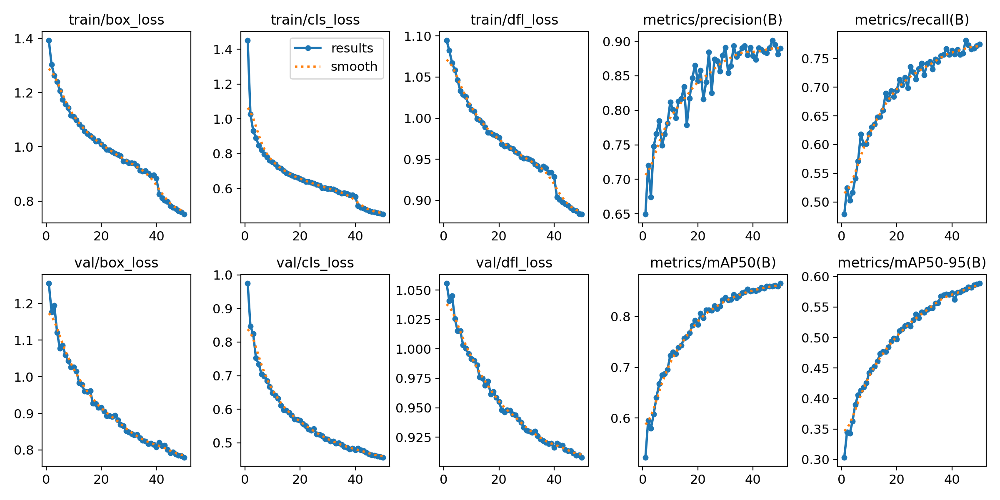

In [ ]:
# Hiển thị kết quả train/val
display(DispImage('/content/yolov8n-kitti-v2/train/results.png', width=600))

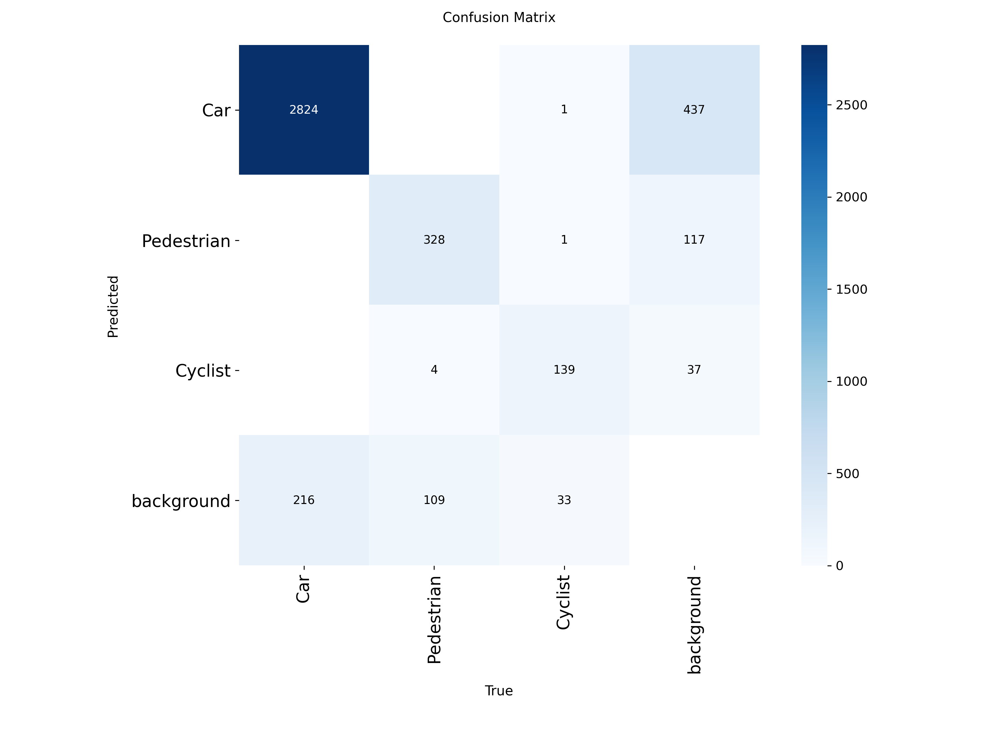

In [ ]:
display(DispImage('/content/yolov8n-kitti-v2/train/confusion_matrix.png', width=600))

### **đánh giá trên toàn bộ tập test**

In [ ]:
# Copy cả thư mục sang Drive
!cp -r "yolov8n-kitti-v2" "/content/drive/MyDrive/Khóa Luận/Data_Object/Code/output_yolov8_fine_tuning_on_kitti_v2"

cp: cannot stat 'yolov8n-kitti-v2': No such file or directory


In [ ]:
# Đường dẫn tới model và thư mục test
model_path = '/content/drive/MyDrive/Khóa Luận/Data_Object/Code/output_yolov8_fine_tuning_on_kitti_v2/train/weights/best.pt'
test_dir   = Path('/content/drive/MyDrive/Khóa Luận/Data_Object/testing/image_2')
out_dir    = Path('/content/drive/MyDrive/Khóa Luận/kitti_submit_yolov8_ft_v2')
out_dir.mkdir(exist_ok=True)

In [ ]:
# Load model
model = YOLO(model_path)

In [ ]:
# Chạy predict từng ảnh, ghi ra KITTI-format .txt
cls_map = {0:'Car', 1:'Pedestrian', 2:'Cyclist'}

In [ ]:
for img_path in sorted(test_dir.glob('*.*')):
    # predict 1 ảnh
    res = model.predict(source=str(img_path), save=False, verbose=False)[0]
    boxes  = res.boxes.xyxy.cpu().numpy()   # shape (N,4)
    classes= res.boxes.cls.cpu().numpy().astype(int)  # shape (N,)
    confs  = res.boxes.conf.cpu().numpy()  # shape (N,)

    # mở file output
    out_txt = out_dir / f"{img_path.stem}.txt"
    with open(out_txt, 'w') as f:
        for (x1,y1,x2,y2), c, p in zip(boxes, classes, confs):
            # KITTI 2D detection format:
            # <class> <trunc> <occl> <alpha> <x1> <y1> <x2> <y2>
            # <dim_x> <dim_y> <dim_z> <loc_x> <loc_y> <loc_z> <rot_y> <score>
            line = (
                f"{cls_map[c]} 0 0 0 "
                f"{x1:.2f} {y1:.2f} {x2:.2f} {y2:.2f} "
                "0 0 0 0 0 0 0 "
                f"{p:.4f}"
            )
            f.write(line + "\n")

print(f"Đã ghi xong {len(list(out_dir.glob('*.txt')))} files vào {out_dir}")

Đã ghi xong 7518 files vào /content/drive/MyDrive/Khóa Luận/kitti_submit_yolov8_ft_v2


In [ ]:
# Nén cả thư mục dạng zip
shutil.make_archive('kitti_predictions_yolov8_ft_v2', 'zip', root_dir=str(out_dir))
print("Tạo file kitti_predictions_yolov8_ft.zip thành công!")

Tạo file kitti_predictions_yolov8_ft.zip thành công!
